# FLUX.2 [klein] — Frontier Image Generation on YOUR GPU

**Black Forest Labs**

FLUX.2 [klein] is our fastest model family: generation **and** editing unified in one compact
architecture, with end-to-end inference in **under a second** — and it's built to run **locally,
on consumer NVIDIA GPUs**. The 4B fits in **~13GB VRAM**: an RTX 3090 or 4070 is enough.

## Why local matters

- Your images never leave your machine
- No per-image cost — iterate as fast as your GPU allows
- **Apache 2.0** (4B): ship it in your product, no strings
- Fine-tune it on your own data, on your own hardware (we'll do exactly that today)

## What's in the box

| | FLUX.2 [klein] 4B | FLUX.2 [klein] 9B |
|---|---|---|
| **License** | Apache 2.0 (commercial OK) | FLUX Non-Commercial |
| **Transformer** | 4B params, 7.8GB bf16 | 9B params, 18.2GB bf16 |
| **Text encoder** | Qwen3 4B (8GB) — a real LLM, not CLIP | Qwen3 8B (16.4GB) |
| **VRAM (bf16)** | ~13GB → RTX 3090 / 4070 | ~24GB → RTX 4090 / 5090 |
| **Steps** | 4 (distilled) | 4 (distilled) |

The text encoder is worth a pause: klein prompts through a **Qwen3 LLM**, not a CLIP-style
encoder. That's why narrative prose prompts and hex codes work — the thing reading your
prompt actually understands language.

## Too big? Take the official quantized weights

BFL publishes quantized transformer weights on [Hugging Face](https://huggingface.co/black-forest-labs) — same model, smaller footprint:

| Variant | 4B transformer | 9B transformer | Runs on |
|---|---|---|---|
| **bf16** | 7.8GB | 18.2GB | 3090/4070+ | 
| **FP8** | 4.1GB | 9.4GB | Ada/Hopper (RTX 40xx+) |
| **NVFP4** | 2.5GB | 5.8GB | Blackwell (RTX 50xx) — built for the newest RTX cards |


## Today

1. **Generate & edit** — klein via the BFL API (same weights you can pull locally)
2. **Hit the wall** — a style the base model doesn't know
3. **Break through it** — train a LoRA on a single RTX 4090 in <60 minutes, with an AI agent doing the boring parts

![Realism](https://cdn.sanity.io/images/2gpum2i6/production/41055678178f6fe75ca618b854b195e48dfc55ed-2127x1400.jpg)

---

## Prerequisites

- **For API demos**: BFL API key from [dashboard.bfl.ai](https://dashboard.bfl.ai/get-started)
- **To run locally**: `diffusers` (`Flux2KleinPipeline`) or ComfyUI — weights on [HF](https://huggingface.co/black-forest-labs/FLUX.2-klein-4B)

---

## Setup

In [35]:
# Install dependencies (uncomment if needed)
# !pip install requests matplotlib pillow torch diffusers transformers accelerate peft bitsandbytes fal-client 

import os
import time
import base64
from io import BytesIO
from pathlib import Path
from typing import Optional, List

import requests
from PIL import Image
import matplotlib.pyplot as plt

from dotenv import load_dotenv

load_dotenv()

# Display settings
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.grid'] = False

print("Setup complete!")

Setup complete!


In [36]:
# Configuration
BFL_API_KEY = os.environ.get("BFL_API_KEY")

API_BASE = "https://api.bfl.ai/v1"

OUTPUT_DIR = Path("./outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

def get_headers():
    """Get headers for BFL API requests."""
    return {
        "accept": "application/json",
        "x-key": BFL_API_KEY,
        "Content-Type": "application/json",
    }

---

# Part 1: FLUX.2 Klein 9B via API

Klein 9B is our best Klein model — sub-second generation with excellent prompt following.

| Model | License | Speed | VRAM (local) |
|-------|---------|-------|--------------|
| **Klein 9B** | FLUX Non-Commercial | Sub-second | ~24GB |
| **Klein 4B** | Apache 2.0 | Sub-second | ~13GB |

## 1.1 Helper Functions

In [37]:
def submit_request(endpoint: str, payload: dict) -> dict:
    """Submit a request to the BFL API."""
    url = f"{API_BASE}/{endpoint}"
    response = requests.post(url, headers=get_headers(), json=payload)
    response.raise_for_status()
    return response.json()


def poll_result(polling_url: str, max_wait: int = 120) -> dict:
    """Poll for the result of an async request."""
    start = time.time()
    
    while time.time() - start < max_wait:
        response = requests.get(polling_url, headers={"accept": "application/json", "x-key": BFL_API_KEY})
        result = response.json()
        
        status = result.get("status")
        if status == "Ready":
            return result["result"]
        elif status == "Failed":
            raise Exception(f"Generation failed: {result.get('error', 'Unknown error')}")
        
        time.sleep(0.5)
    
    raise TimeoutError(f"Request timed out after {max_wait}s")


def generate_image(endpoint: str, payload: dict, show: bool = True) -> Image.Image:
    """Generate an image and optionally display it."""
    print(f"Submitting request to {endpoint}...")
    response = submit_request(endpoint, payload)
    
    request_id = response["id"]
    polling_url = response["polling_url"]
    cost = response.get("cost", "N/A")
    
    print(f"Request ID: {request_id}")
    print(f"Cost: {cost} credits")
    print("Waiting for result...")
    
    result = poll_result(polling_url)
    
    image_url = result["sample"]
    image_response = requests.get(image_url)
    image = Image.open(BytesIO(image_response.content))
    
    if show:
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')
        prompt_preview = payload.get('prompt', '')[:80]
        plt.title(f"{prompt_preview}...", fontsize=10, wrap=True)
        plt.tight_layout()
        plt.show()
    
    return image


def display_images_grid(images: List[Image.Image], titles: List[str] = None, cols: int = 3):
    """Display multiple images in a grid."""
    n = len(images)
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten() if n > 1 else [axes]
    
    for idx, (ax, img) in enumerate(zip(axes, images)):
        ax.imshow(img)
        ax.axis('off')
        if titles and idx < len(titles):
            ax.set_title(titles[idx], fontsize=10)
    
    for ax in axes[n:]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

## 1.2 Text-to-Image with Klein 9B

Let's see what Klein 9B can do out of the box. Remember: **narrative prose, not keywords**.

Submitting request to flux-2-klein-9b...
Request ID: f98259b5-b30c-46cb-801b-7e003514faf8
Cost: 1.7000000000000002 credits
Waiting for result...


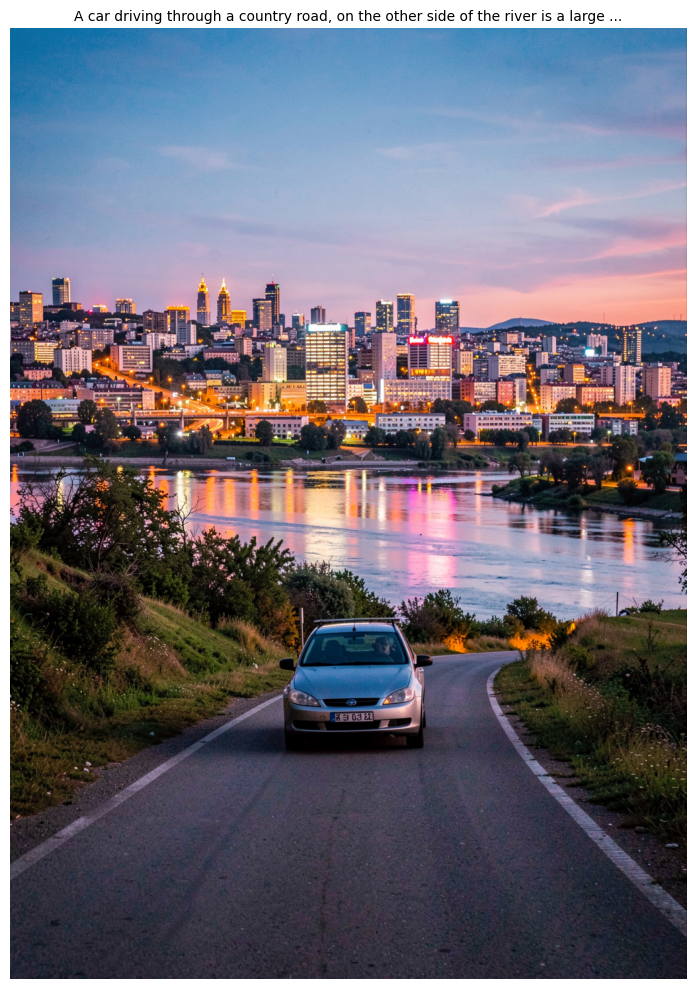

In [38]:
# A well-crafted narrative prompt
prompt = """
A car driving through a country road, on the other side of the river is a large city in the background, colorful, vibrant glow
""".strip()

payload = {
    "prompt": prompt,
    "width": 1024,
    "height": 1440,
    "seed": 42
}

image = generate_image("flux-2-klein-9b", payload)

Generating architectural shot...
Submitting request to flux-2-klein-9b...
Request ID: 58607346-f902-42e2-86fa-7299737876c8
Cost: 1.7000000000000002 credits
Waiting for result...


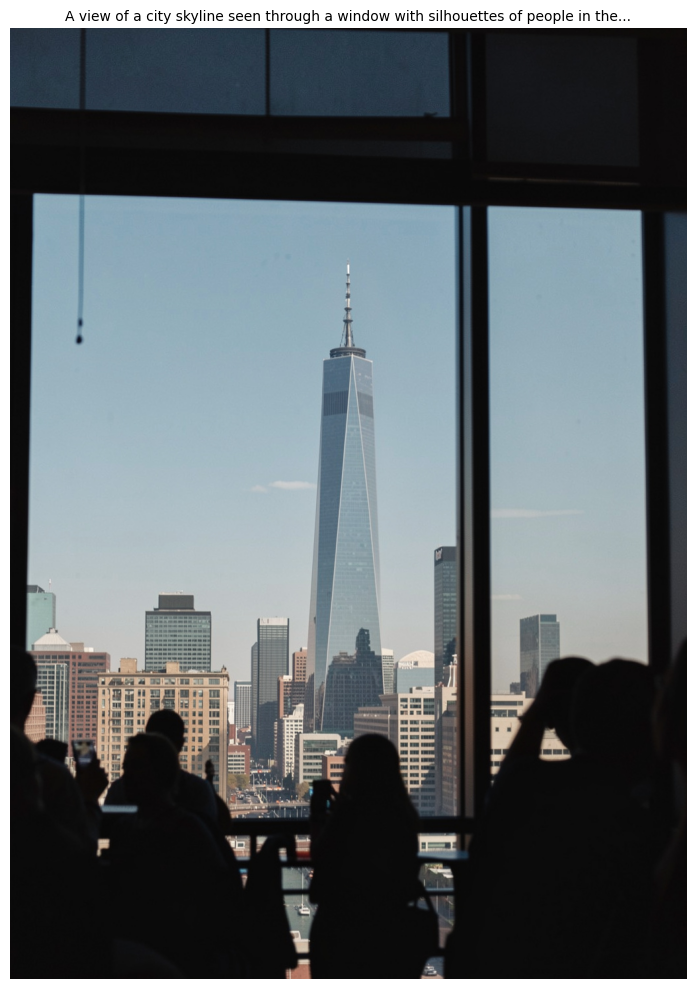


Generating product shot...
Submitting request to flux-2-klein-9b...
Request ID: 1aaf5629-3ee4-42d7-ad86-b5f17ceeb91c
Cost: 1.7000000000000002 credits
Waiting for result...


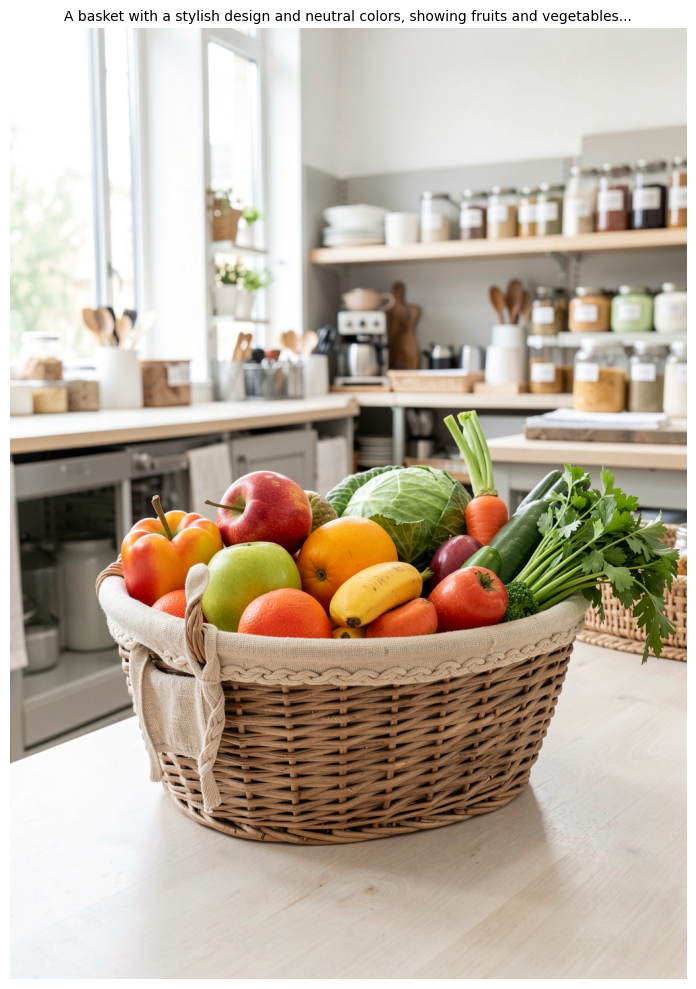

In [39]:
# More examples showcasing Klein 9B's strengths

# Architectural photography
arch_prompt = """
A view of a city skyline seen through a window with silhouettes of people in the foreground. 
The One World Trade Center tower rises prominently in the center against a clear blue sky. 
The scene has a soft, muted color palette, giving it a serene and contemplative atmosphere.
""".strip()

# Product photography
product_prompt = """
A basket with a stylish design and neutral colors, showing fruits and vegetables, 
realistic product illustration, kitchen supply store setting, clean and practical, natural lighting
""".strip()

print("Generating architectural shot...")
arch_image = generate_image("flux-2-klein-9b", {"prompt": arch_prompt, "width": 1024, "height": 1440, "seed": 100}, show=True)

print("\nGenerating product shot...")
product_image = generate_image("flux-2-klein-9b", {"prompt": product_prompt, "width": 1024, "height": 1440, "seed": 200}, show=True)

## 1.3 Hex Color Matching

FLUX.2 supports precise color specification via hex codes — great for brand consistency.

Submitting request to flux-2-klein-9b...
Request ID: 3da7ffe2-7ddc-4b9f-8e4b-3b9ff952ec4a
Cost: 1.7000000000000002 credits
Waiting for result...


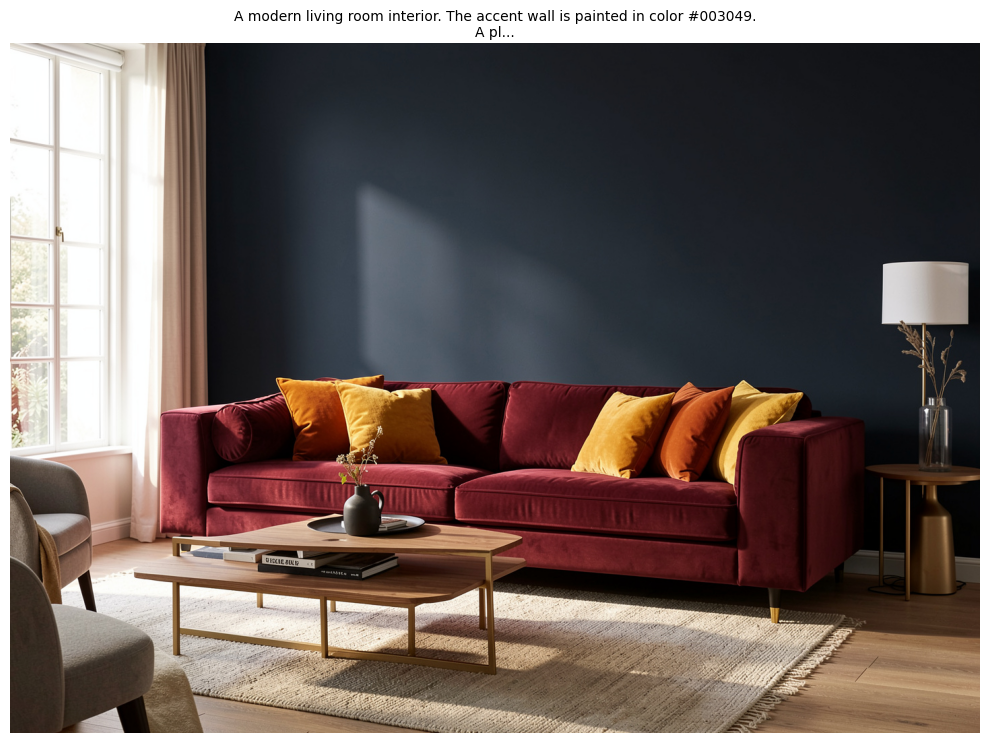

In [40]:
# Brand colors via hex codes
brand_prompt = """
A modern living room interior. The accent wall is painted in color #003049.
A plush velvet sofa in color #D62828 sits against it. 
Throw pillows in color #F77F00 and color #FCBF49 add contrast. 
Natural daylight creates a warm, inviting atmosphere. 
Interior design magazine style photography.
""".strip()

payload = {
    "prompt": brand_prompt,
    "width": 1440,
    "height": 1024,
    "seed": 123
}

color_image = generate_image("flux-2-klein-9b", payload)

---

# Part 2: Image Editing with Klein

**FLUX.2 Klein is the best open-source image editing model in the world.**

It excels at understanding context, preserving what matters, and making precise transformations. Whether you're swapping backgrounds, changing styles, or composing multiple references — Klein delivers.

### Key Principle
Reference images carry the visual details. Your prompt describes *what should change*, not what the image looks like.

### Edit Types
| Type | Description | Example Prompt |
|------|-------------|----------------|
| **Background swap** | Change the environment | "Place her in a coffee shop" |
| **Style transfer** | Apply a new visual style | "Turn into a watercolor painting" |
| **Object replacement** | Swap specific elements | "Replace the bike with a horse" |
| **Element addition** | Add new objects | "Add a cat sleeping on the chair" |
| **Attribute change** | Modify properties | "Change the dress from blue to red" |

In [41]:
# Helper for image editing
def image_to_base64(image: Image.Image) -> str:
    """Convert a PIL Image to base64 string."""
    buffer = BytesIO()
    image.save(buffer, format="PNG")
    return base64.b64encode(buffer.getvalue()).decode("utf-8")

## Examples

### Motorcycle input
![Input Image](https://cdn.sanity.io/images/2gpum2i6/production/59fdd6b45c1d2d4180390ae98380a9425ce8bd99-765x956.jpg)

Submitting request to flux-2-klein-9b...
Request ID: 911f2526-0495-4361-9a8e-c5707bea1761
Cost: 1.7000000000000002 credits
Waiting for result...


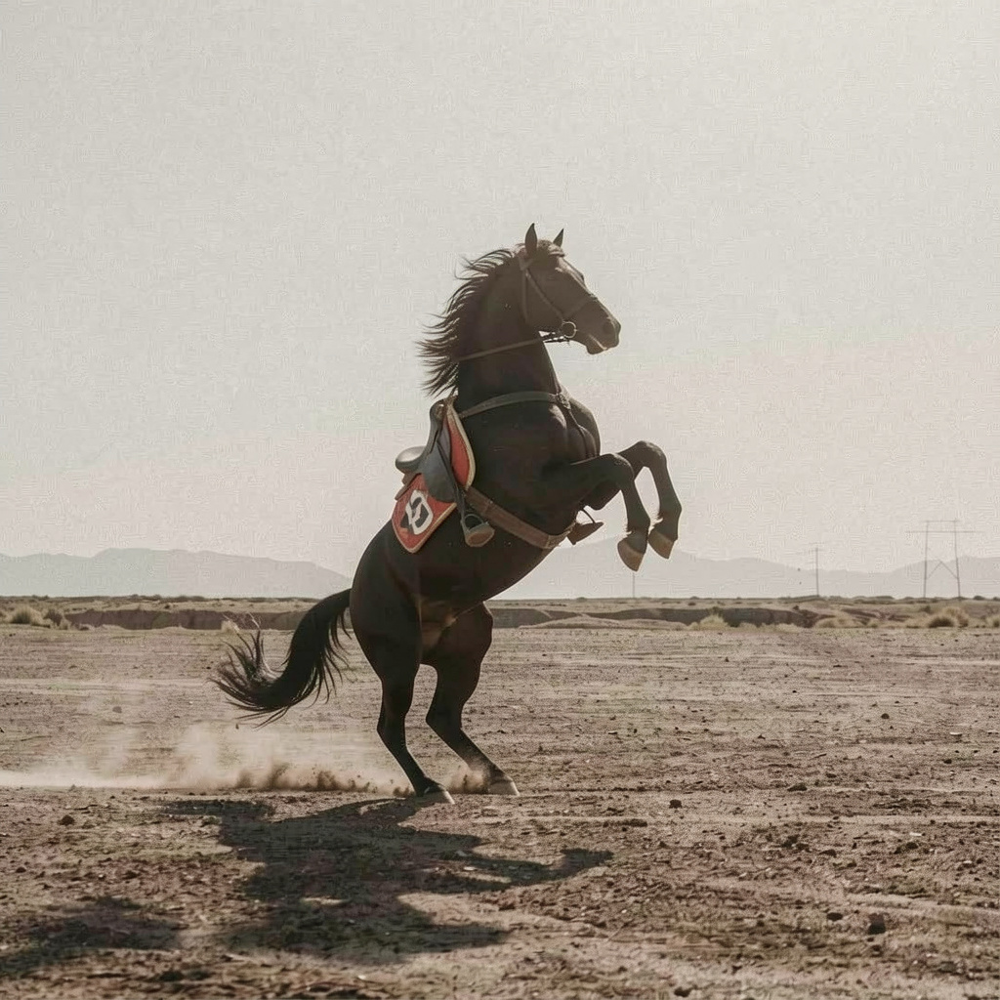

In [42]:
generate_image(
    "flux-2-klein-9b",
    {
        "prompt": "Replace the bike with a rearing black horse",
        "input_image": "https://cdn.sanity.io/images/2gpum2i6/production/59fdd6b45c1d2d4180390ae98380a9425ce8bd99-765x956.jpg",
        "width": 1024,
        "height": 1024,
        "seed": 42},
    show=False
)

### Edit style
![Input Image](https://cdn.sanity.io/images/2gpum2i6/production/00f3de86b945fb15ebf80fedb73bf25613a6cc63-627x1115.jpg)

Submitting request to flux-2-klein-9b...
Request ID: a0001327-53c1-4802-aeb2-7fd95e5e2ca8
Cost: 1.7000000000000002 credits
Waiting for result...


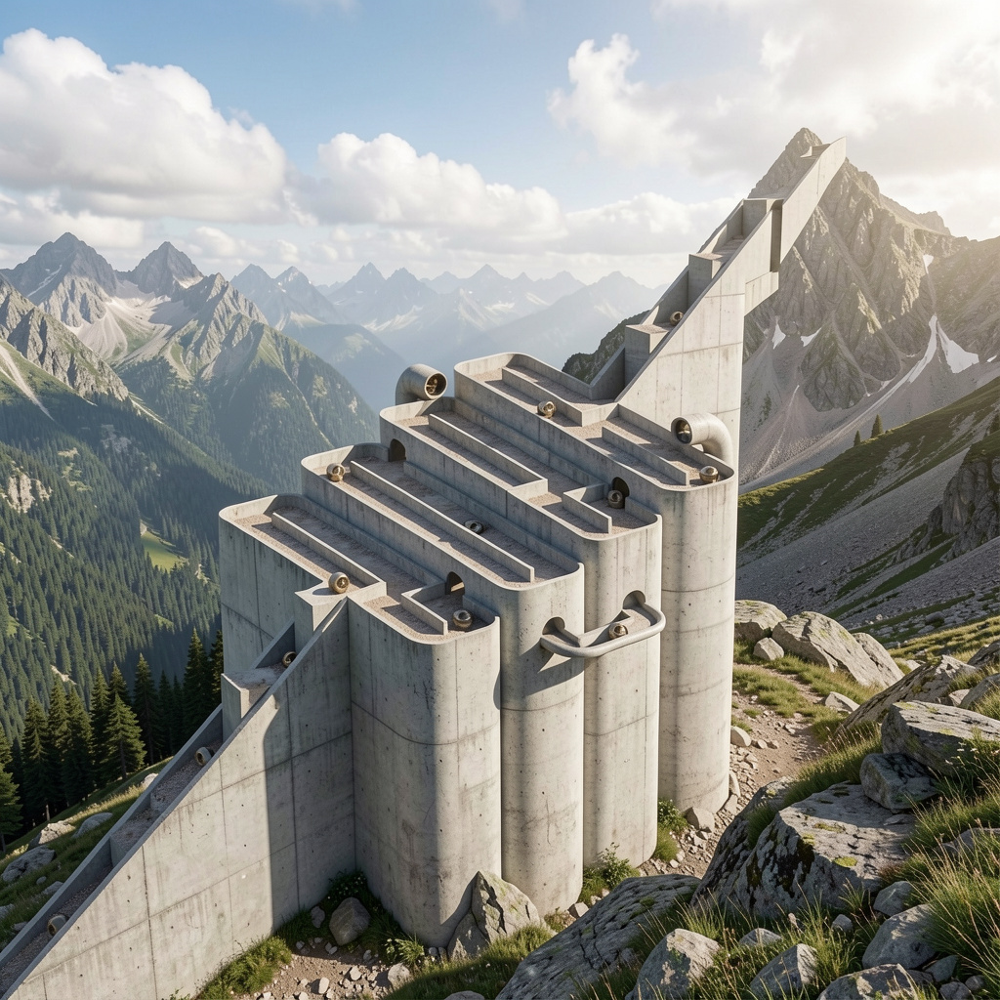

In [43]:
generate_image(
    "flux-2-klein-9b",
    {
        "prompt": "Reskin this into a realistic mountain vista. The building is made of concrete",
        "input_image": "https://cdn.sanity.io/images/2gpum2i6/production/00f3de86b945fb15ebf80fedb73bf25613a6cc63-627x1115.jpg",
        "width": 1024,
        "height": 1024,
        "seed": 42},
    show=False
)

### Where the base model hits its limits

Sometimes the base model can't produce the *exact* style you need, no matter how you prompt it.
This is where FLUX.2 [klein] **base** models shine: they are undistilled and very finetunable.

For example, let's ask for authentic **medieval marginalia** — the creatures monks doodled
in manuscript margins (13th–15th century). Watch what the base model does with it:

Submitting request to flux-2-klein-9b...
Request ID: 0099176e-a766-475f-91f6-3ea4ca88abb3
Cost: 1.5 credits
Waiting for result...


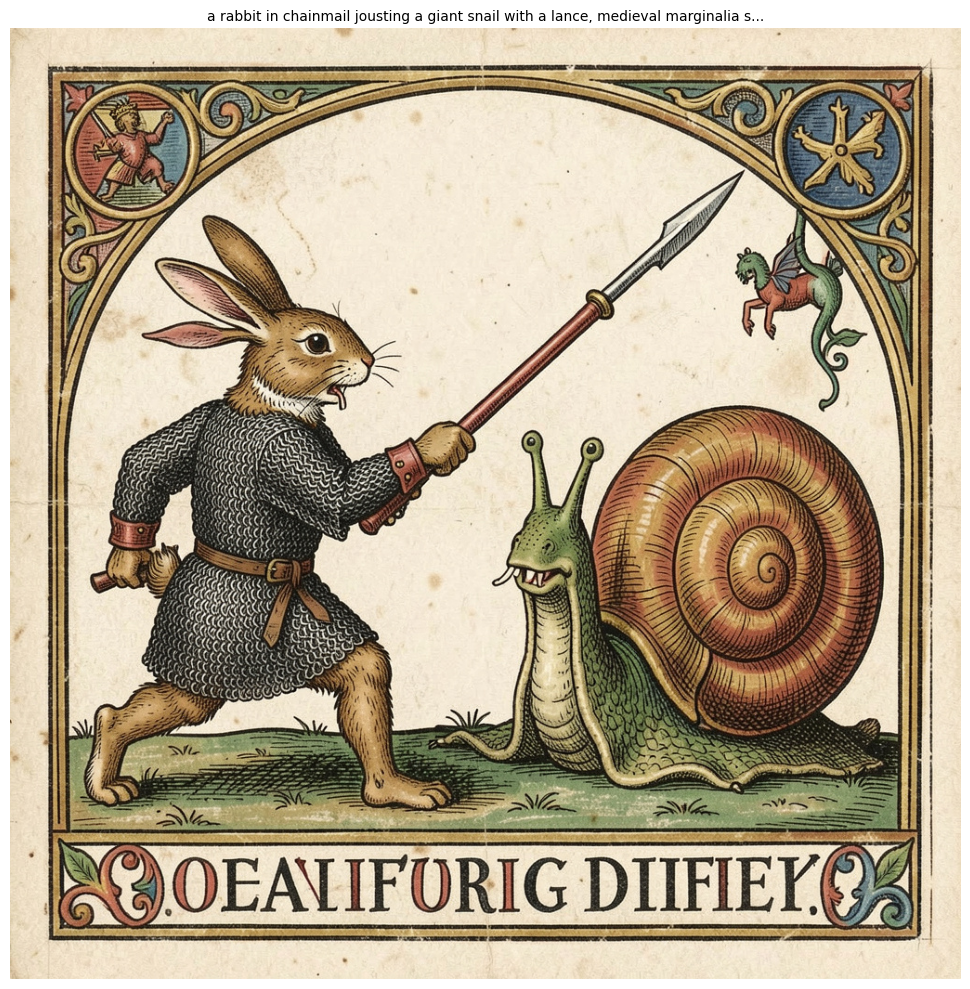

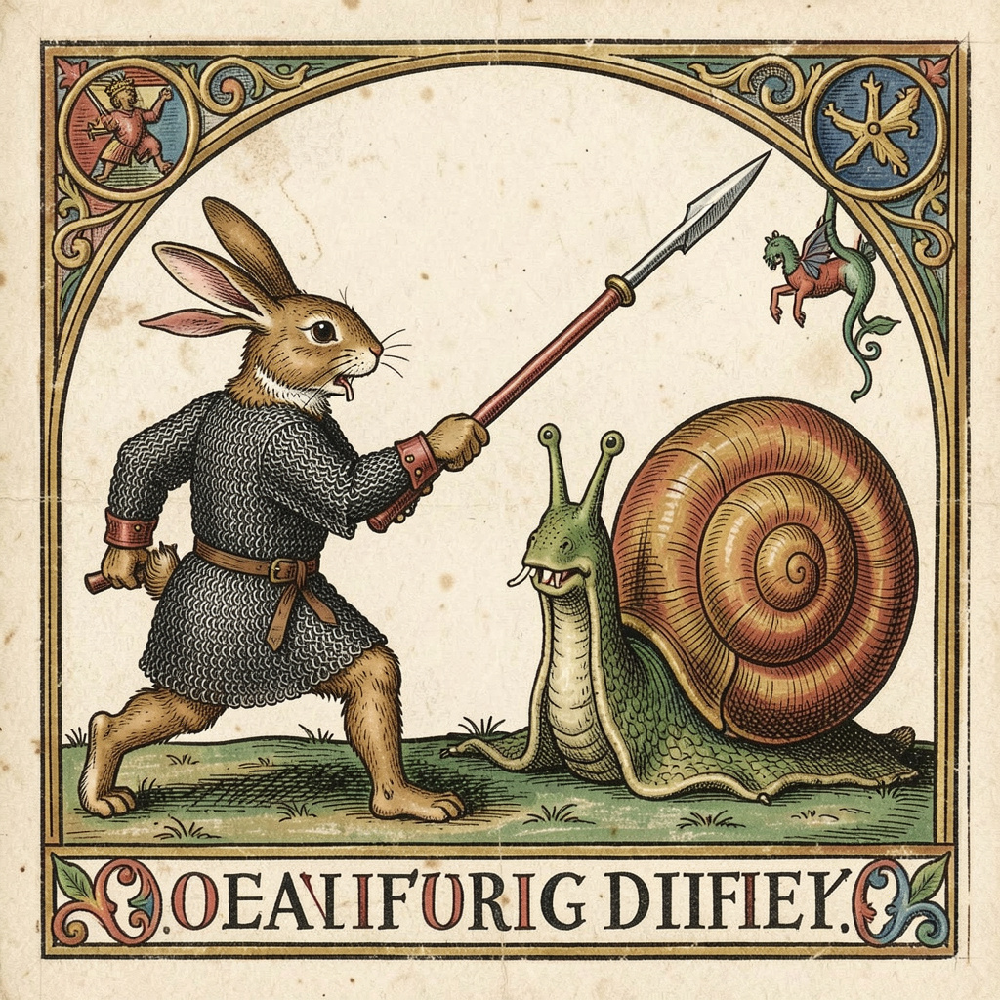

In [44]:
# Base klein, no LoRA: it gives a generic, clean "medieval illustration" —
# missing the parchment tone, the weird proportions, the page artifacts of real marginalia
generate_image(
    "flux-2-klein-9b",
    {
        "prompt": "a rabbit in chainmail jousting a giant snail with a lance, medieval marginalia style",
        "width": 1024,
        "height": 1024,
        "seed": 42,
    },
    show=True,
)

## So let's teach it the style — training a LoRA on klein

![https://pbs.twimg.com/media/HKdn_RWWMAAM2sZ?format=jpg&name=large](https://pbs.twimg.com/media/HKdn_RWWMAAM2sZ?format=jpg&name=large)
This is the point of the klein **base** models: they're undistilled and small enough that
you don't need a cluster. This LoRA was trained on a **single RTX 4090**, and the run took under
**60 minutes**. 

A LoRA doesn't retrain the model. It learns a small adapter (~100MB) on top of the frozen
base — enough to teach it one new thing, like a style it has never really seen.

### The part nobody enjoys — so I gave it to an agent

The training run is the fast part, the really annoying part is what happens before that: finding images, checking licenses, filtering junk, writing captions. I handed
all of that to [Hermes Agent](https://dev.to/stephen_btl/training-a-lora-on-flux2-klein-with-hermes-agent-2k05):

- **The idea itself**: I asked for styles the base model is weak at — it shortlisted risograph
  misregistration, Soviet schematics, ukiyo-e diagrams... and medieval marginalia
- **Sourcing**: pulled **199 candidates** from Wikimedia Commons with license + resolution metadata
- **Vetting**: is it really public domain? real marginalia or just a text page? a duplicate crop?
- **Curation**: wrote itself a scoring script, ran a VLM pass, picked a deliberate mix of **30**
- **Captioning**: built a captioning pipeline — and scrubbed the style words the VLM kept sneaking in
- **Training**: wrote the ai-toolkit config and ran the job on RunPod

The 30 that survived:

![the training set](assets/marginalia/dataset_tour.jpg)

The captioning rule is the one thing to remember: describe **what's in the image and nothing
about the style** (no "medieval", no "manuscript", no "ink"). The style has to come from the
pixels; a made-up trigger word (`MRGN_DRLR`) becomes the handle you pull it out with later.


[https://x.com/stephenbtl/status/2064734767266807965](https://x.com/stephenbtl/status/2064734767266807965)

### Watching the model learn

Same prompt, same seed, sampled at every checkpoint — you can watch the style arrive.
Around step 500 the parchment tone and line work show up; at **step 1000** style, subject and
composition balance out; past that, fake script starts crowding the page and the palette
turns to mud:

![checkpoint progression](assets/marginalia/checkpoint_progression.jpg)

The loss curve kept improving the whole time. If I had picked the checkpoint by loss, I'd have
shipped step 2000 — the one that looks worse. For LoRAs: generate samples at fixed prompts and
seeds, and trust your eyes over the curve.

Full write-up: [Training a LoRA on FLUX.2 [klein] with Hermes Agent](https://dev.to/stephen_btl/training-a-lora-on-flux2-klein-with-hermes-agent-2k05) —
weights + dataset on [Hugging Face](https://huggingface.co/stephenbtl/marginalia-drolleries-klein-4b-lora).

The step-1000 checkpoint is hosted on the BFL platform. Same rabbit, same snail, same seed as
the base attempt above — now with the trigger word:

Submitting request to flux-2-klein-4b-finetuned...
Request ID: def9521e-a952-4804-8f17-6722fdd7c13c
Cost: 1.4000000000000001 credits
Waiting for result...


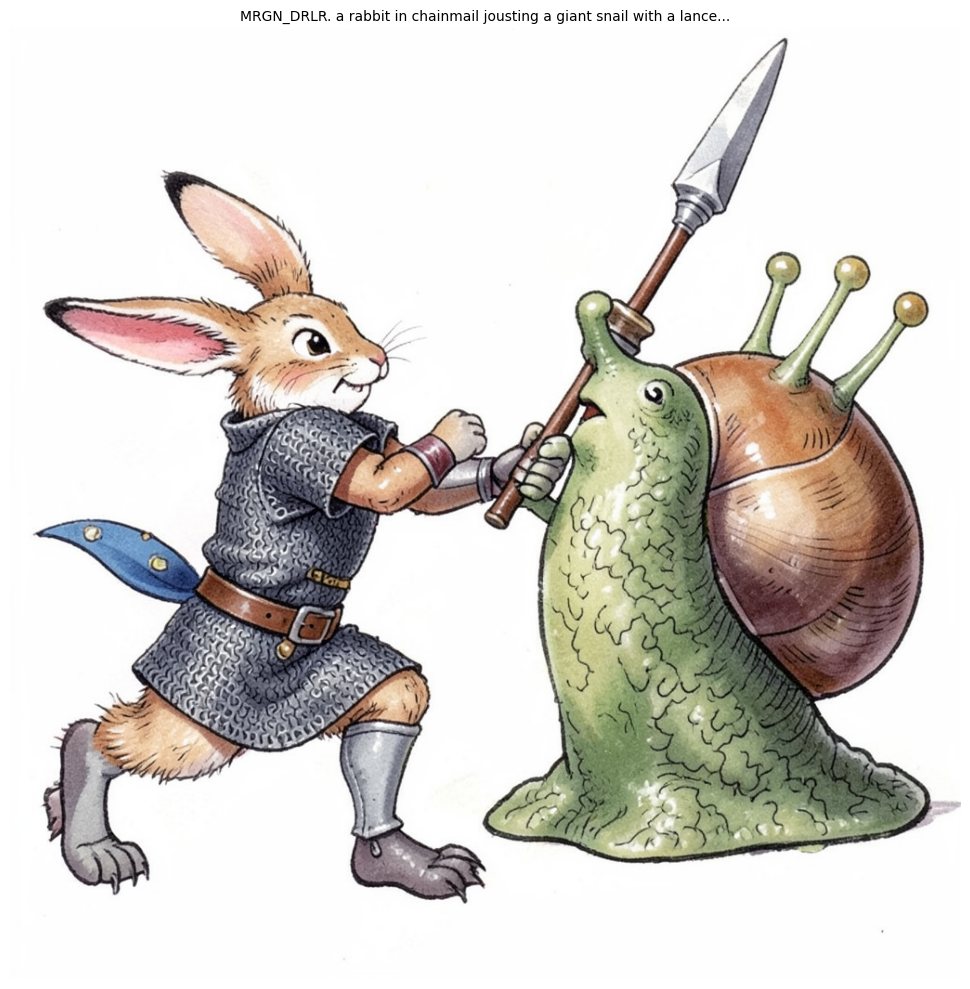

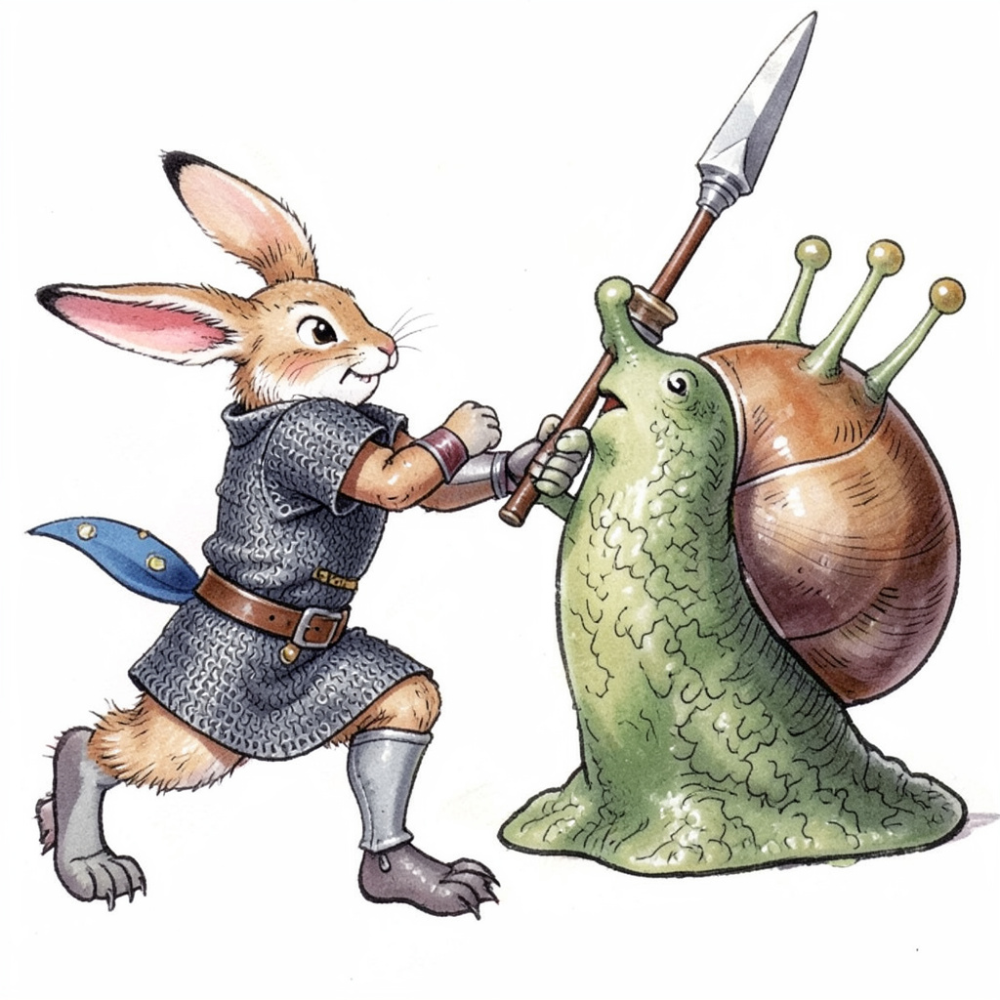

In [45]:
# Same subject, same seed — but now with the marginalia LoRA (hosted on BFL)
generate_image(
    "flux-2-klein-4b-finetuned",
    {
        "prompt": "MRGN_DRLR. a rabbit in chainmail jousting a giant snail with a lance",  # trigger word
        "finetune_id": "marginalia",
        "finetune_strength": 1,
        "seed": 42,
    },
    show=True,
)

---

## Resources

### API & Documentation
- **API Getting Started**: [Getting Started](https://dashboard.bfl.ai/get-started)
- **Docs**: [docs.bfl.ai](https://docs.bfl.ai)
- **Playground**: [playground.bfl.ai](https://playground.bfl.ai)

### Models & Training
- **Hugging Face**: [huggingface.co/black-forest-labs](https://huggingface.co/black-forest-labs)
- **Klein 9B Base**: `black-forest-labs/FLUX.2-klein-9B-base`
- **Klein 4B Base**: `black-forest-labs/FLUX.2-klein-4B-base`

### Community
- **GitHub**: [github.com/black-forest-labs](https://github.com/black-forest-labs)

---

*Workshop by Black Forest Labs x NVIDIA*